In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab
%matplotlib inline
import seaborn as sns
from bokeh import mpl

#https://joernhees.de/blog/2015/08/26/scipy-hierarchical-clustering-and-dendrogram-tutorial/#Perform-the-Hierarchical-Clustering
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import *
import pydendroheatmap as pdh

import pickle

In [12]:
#scratch
#delaystats=pd.read_csv('/Users/jzhang/personalDropbox/dataIncubator/challenge/project/992647185_112015_1613_airline_delay_causes.csv')
delaystats=pd.read_csv('/home/vagrant/capstone/data/delayDatabyMonth/992647185_112015_1613_airline_delay_causes.csv')

#pickle the dataframe
delaystats.to_pickle('DelayStatsByMonth.pickle')

from IPython.display import Image

# Overview of Domestic Traffic at Major Airports

How does the traffic look at major airports?
One logical way to represent the data is as a graph.
1. Nodes are airports; the size of each node is scaled the the business of the respective airports.
2.  Edges represent flights between those airports; the color of the eds indicates the airline
3. The 5 major U.S. Carriers are shown near their major hubs. For example, Delta's main hub is in Atlanta, and this is clear from the abundance of orange edges emerging from ATL.

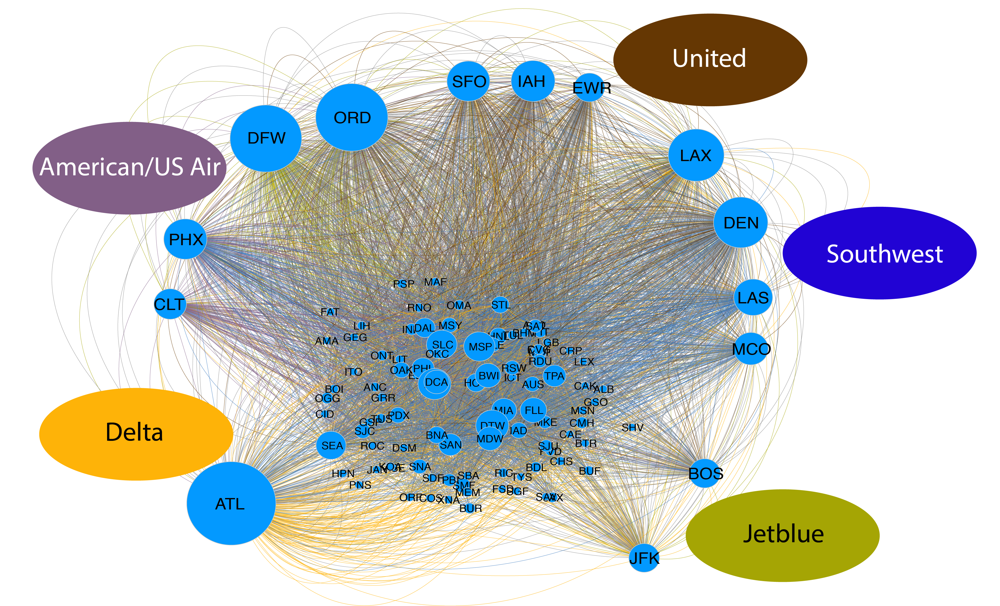

In [36]:
#Flights
Image(filename="/home/vagrant/capstone/ipynb/v3_hubsByAirlines_jan2015_flights_viz.cys.png") 

For a quick look at the unprocessed summary data, see below. 
What patterns can we glean from this table?

In [2]:
delaystats.head(2)

,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay,Unnamed: 21
0,2003,6,AA,American Airlines Inc.,ABQ,"Albuquerque, NM: Albuquerque International Sun...",307,56,14.68,10.79,...,9.96,1,1,2530,510,621,676,25,698,NaN
1,2003,6,AA,American Airlines Inc.,ANC,"Anchorage, AK: Ted Stevens Anchorage Internati...",90,27,7.09,2.00,...,7.16,0,0,1390,271,83,581,0,455,NaN


In [17]:
df_2014stats=delaystats[delaystats.year==2014] #df[(df.A == 1) & (df.D == 6)]
len(delaystats)
len(df_2014stats)
df_2014stats
df_2014_groupBy_Airline_Airport=df_2014stats.groupby(['carrier','airport'],as_index=False).sum()
df_2014_groupBy_Airline_Airport.head()
AirportByCarrier_df=pd.pivot_table(df_2014_groupBy_Airline_Airport,values='arr_flights',index=['airport'],columns=['carrier'])
AirportByCarrier_df=AirportByCarrier_df.fillna(value=0)

shortCarrierName=['AA:American','AS:Alaska','B6:Jetblue','DL:Delta','EV:AtlanticSE','F9:Frontier','FL:Airtran',
                  'HA:Hawaiian','MQ:AmerEagle','OO:Skywest','UA:United','US:USAirways','VX:Virgin','WN:SouthW']
#plt.pcolor(AirportByCarrier_df)

In [18]:
top19_AirportByCarrier_df

NameError: name 'top19_AirportByCarrier_df' is not defined

In [31]:
#pull out flight data for top 19 airports; otherwise matrix too sparse.
#http://stanford.edu/~mwaskom/software/seaborn/generated/seaborn.clustermap.html#seaborn.clustermap

top19_AirportByCarrier_df=AirportByCarrier_df.loc[top19airportsList]

#plt.pcolor(AirportByCarrier_df.loc[top19airportsList])

#colors=(sns.color_palette("BuPu",2)+
#        sns.color_palette("RdPu",1)+
#        sns.color_palette("YlGn",2)+
#        sns.color_palette("BuPu",2)+
#        sns.color_palette("BuPu",2)+
#        sns.color_palette("BuPu",2)+
#        sns.color_palette("BuPu",2)+
#        sns.color_palette("BuPu",1))

cG=sns.clustermap(top19_AirportByCarrier_df.transpose(),
               z_score=0,
               figsize=(11,10))
cG.fig.suptitle('Clustering of 2014 flights by Airline and Airport',fontsize=14,fontweight='bold')
cG.savefig("AirlineByAirpot_2014_clustermap.png",dpi=150)
cG.savefig("AirlineByAirpot_2014_clustermap.svg",dpi=150)
#fig.savefig("delaysByMonth.png",dpi=150)
#cG.fig.text()
#cG.row_colors(['black'])
#labels=shortCarrierName
#(locs,labels)=cG.dendrogram_row.xticks
#top19airportsList

NameError: name 'top19airportsList' is not defined

In [433]:
top19_AirportByCarrier_df
shortCarrierName
#plt.pcolor(top19_AirportByCarrier_df)


['AA:American',
 'AS:Alaska',
 'B6:Jetblue',
 'DL:Delta',
 'EV:AtlanticSE',
 'F9:Frontier',
 'FL:Airtran',
 'HA:Hawaiian',
 'MQ:AmerEagle',
 'OO:Skywest',
 'UA:United',
 'US:USAirways',
 'VX:Virgin',
 'WN:SouthW']

In [33]:
#delaystats.head()
df_2014stats=delaystats[delaystats.year==2014]
len(df_2014stats)

#groupBy_Airport_2014[:,['airport']]
SumGroupBy_Airport_2014=df_2014stats.groupby(['airport'],as_index=False).sum()
#len(groupBy_Airport_2014)
#MarketShare=groupBy_Airline['arr_flights'].agg({'total flights':np.sum})

In [34]:
top19busiestAirports_df=SumGroupBy_Airport_2014.sort_values(by="arr_flights",ascending=False).head(19)
delayStats_top19Airports=top19busiestAirports_df.loc[:,['airport','arr_flights','carrier_ct',' weather_ct','nas_ct','security_ct','late_aircraft_ct']]
delayStats_top19Airports['onTime']=top19busiestAirports_df['arr_flights']-top19busiestAirports_df['arr_del15']
top19airportsList=delayStats_top19Airports['airport'].tolist()
top19airportsList
#airportsList
#top19busiestAirports_df.head()



AttributeError: 'DataFrame' object has no attribute 'sort_values'

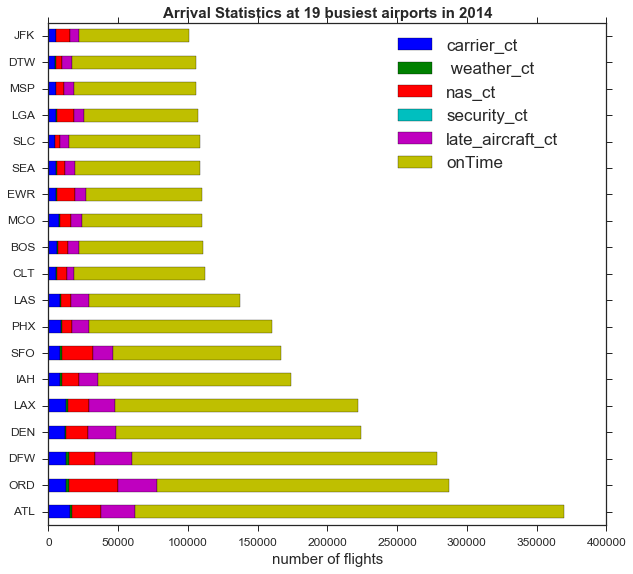

In [486]:
#http://matplotlib.org/examples/lines_bars_and_markers/barh_demo.html
df=delayStats_top19Airports[['airport','carrier_ct',' weather_ct','nas_ct','security_ct','late_aircraft_ct','onTime']]
#BusiestAirportStackedPlot=df.sort_values(by="arr_flights").plot(kind='barh',stacked=True,figsize=(10,9),title='Arrival Statistics from 19 busiest airports')
BusiestAirportStackedPlot=df.plot(kind='barh',stacked=True,figsize=(10,9),title='Arrival Statistics at 19 busiest airports in 2014',fontsize=12)
y_pos=np.arange(len(top19airportsList))
plt.title('Arrival Statistics at 19 busiest airports in 2014',fontweight='bold',fontsize=15)

plt.yticks(y_pos,top19airportsList)
plt.xlabel('number of flights',fontsize=15)
plt.legend(bbox_to_anchor=(.6,1),loc=2,prop={'size':17})

plt.savefig('ArrivalDelayBreakdown_19busiestAirports_2014.png',dpi=150)
plt.savefig('ArrivalDelayBreakdown_19busiestAirports_2014.svg',dpi=150)
#notes: delay stats for 19 busiest airports, sorted increasing in number of flights. 
#can see some delay categories overrepresented, for example nas at SFO and ORD

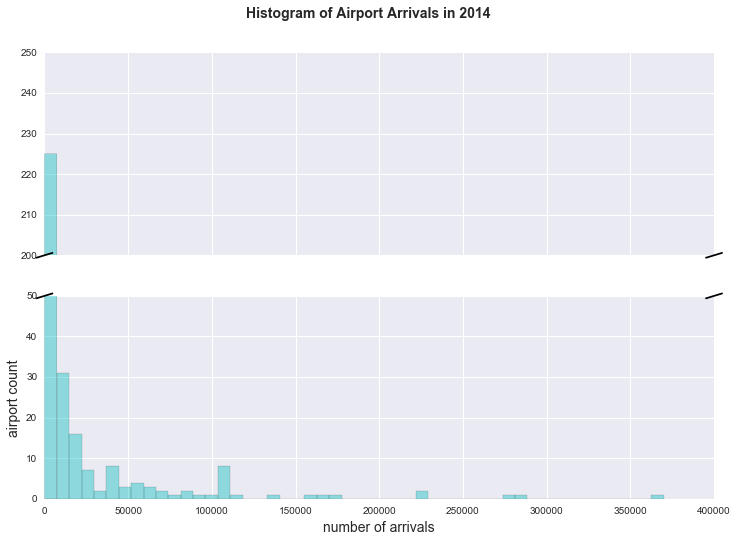

In [491]:
#https://stanford.edu/~mwaskom/software/seaborn/tutorial/distributions.html#plotting-bivariate-distributions
#https://github.com/matplotlib/matplotlib/blob/master/examples/pylab_examples/broken_axis.py
#SumGroupBy_Airport_2014['arr_flights'].plot(kind='hist')
NonZeroArrivalsByAirportArray=SumGroupBy_Airport_2014[SumGroupBy_Airport_2014.arr_flights>0]
sns.set(rc={"figure.figsize":(12,8)})
fig,(ax,ax2)=plt.subplots(2,1,sharex=True)
fig.suptitle('Histogram of Airport Arrivals in 2014',fontsize=14,fontweight='bold')
sns.distplot(NonZeroArrivalsByAirportArray['arr_flights'],kde=False,rug=False,ax=ax,color="c")
ax.set_ylim(200,250)#just show outliers
sns.distplot(NonZeroArrivalsByAirportArray['arr_flights'],kde=False,rug=False,ax=ax2,color="c")
ax2.set_ylim(0,50)#zoom in where most of the variability is happening

# hide the spines between ax and ax2
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax2.spines['top'].set_visible(False)
ax2.set_xlabel('number of arrivals',fontsize=14)
ax2.set_ylabel('airport count',fontsize=14)
ax.xaxis.tick_top()
ax.tick_params(labeltop='off')  # don't put tick labels at the top
ax2.xaxis.tick_bottom()

d = .012  # how big to make the diagonal lines in axes coordinates
# arguments to pass plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((-d, +d), (-d, +d), **kwargs)        # top-left diagonal
ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)  # top-right diagonal

kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # bottom-left diagonal
ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)  # bottom-right diagona
fig.savefig("Histogram_of_Airport_Arrivals_2014.png",dpi=150)
fig.savefig("Histogram_of_Airport_Arrivals_2014.svg",dpi=150)

In [179]:
delaystats['fracDelay']=delaystats['arr_del15']/delaystats['arr_flights']
#delaystats.head(5)

In [23]:
#https://stanford.edu/~mwaskom/software/seaborn/examples/grouped_boxplot.html
tips=sns.load_dataset("tips")
#tips.head()
#sns.boxplot(x="day",y="total_bill",hue="sex",data=tips,palette="PRGn")


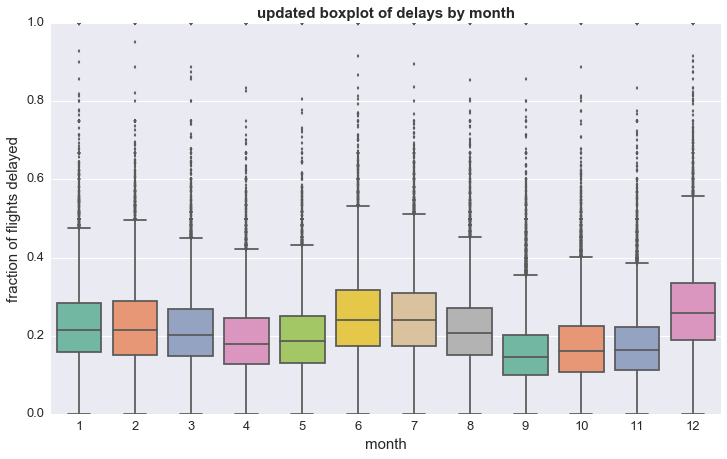

In [502]:
plt.figure(figsize=(12,7)) #https://stanford.edu/~mwaskom/software/seaborn/tutorial/aesthetics.html#aesthetics-tutorial
delayboxplot=sns.boxplot(x="month",y="fracDelay",data=delaystats,fliersize=3,palette="Set2")
plt.title('updated boxplot of delays by month',fontweight='bold',fontsize=15)
plt.xlabel('month',fontsize=15)
plt.ylabel('fraction of flights delayed',fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.savefig("newBoxPlotsByMonth.png",dpi=150)
plt.savefig("newBoxPlotsByMonth.svg",dpi=150)
#delayboxplot=sns.swarmplot(x="month",y="fracDelay",data=delaystats)

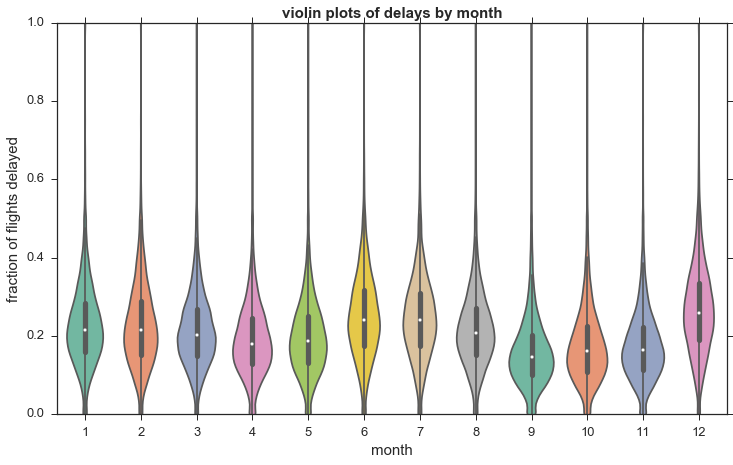

In [524]:
#delayboxplot=sns.boxplot(x="month",y="fracDelay",data=delaystats)
plt.figure(figsize=(12,7))
delayviolin=sns.violinplot(x="month",y="fracDelay",data=delaystats,palette="Set2")
delayviolin.set(ylim=(0, 1))
plt.title('violin plots of delays by month',fontweight='bold',fontsize=15)
plt.xlabel('month',fontsize=15)
plt.ylabel('fraction of flights delayed',fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.savefig("violinDelayPlotsByMonth.png",dpi=150)
plt.savefig("violinDelayPlotsByMonth.svg",dpi=150)

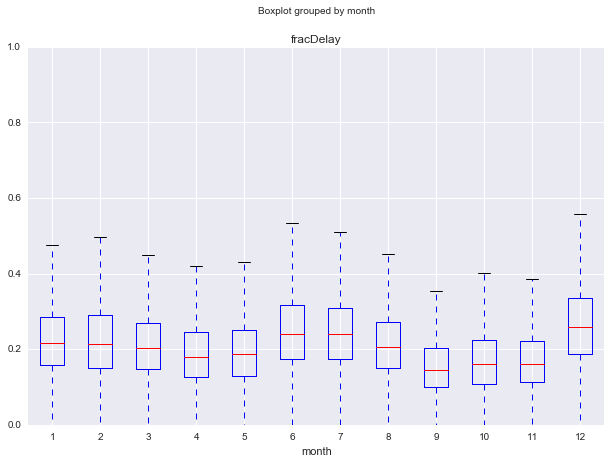

In [39]:
boxplot_delaysByMonth=delaystats.boxplot(column='fracDelay',by='month',figsize=(10,7))

In [22]:
fig=boxplot_delaysByMonth.get_figure()
fig.savefig("delaysByMonth.png",dpi=150)


NameError: name 'boxplot_delaysByMonth' is not defined

In [21]:
#marketshare as a function of time
marketShareData=delaystats[['year','month','carrier','carrier_name','arr_flights']]
groupBy_Airline=marketShareData.groupby(['year','carrier_name'],as_index=False)
groupBy_Airline.head()
MarketShare=groupBy_Airline['arr_flights'].agg({'total flights':np.sum})
MarketShare.head()

,year,carrier_name,total flights
0,2003,ATA Airlines d/b/a ATA,42219
1,2003,AirTran Airways Corporation,86753
2,2003,Alaska Airlines Inc.,98735
3,2003,America West Airlines Inc.,109370
4,2003,American Airlines Inc.,434707


In [23]:
monthly_gb_Airline=marketShareData.groupby(['year','month','carrier_name'],as_index=False)
monthly_gb_Airline.head()
sum_airline_byMonth_df=monthly_gb_Airline['arr_flights'].agg({'total flights':np.sum})
#zero padding: http://stackoverflow.com/questions/23836277/add-leading-zeros-to-strings-in-pandas-dataframe
sum_airline_byMonth_df['month']=sum_airline_byMonth_df['month'].apply(lambda x: '{0:0>2}'.format(x))
#sum_airline_byMonth_df.head()
sum_airline_byMonth_df['year-month']=sum_airline_byMonth_df.year.map(str)+"-"+sum_airline_byMonth_df.month.map(str)
sum_airline_byMonth_df.head()
pivoted_flights_airline_month_df=sum_airline_byMonth_df.pivot(index='year-month',columns='carrier_name',values='total flights')


In [24]:
#normalization-testing
df1=pivoted_flights_airline_month_df
rowNorm_df1=df1.div(df1.sum(axis=1),axis=0)
#rowNorm_df1.plot(kind='area')

In [176]:
#pivoted_flights_airline_month_df.plot(kind='area')

In [25]:
yearByAirline=MarketShare.pivot(index='year',columns='carrier_name',values='total flights')
normalizedYearByAirline=yearByAirline.div(yearByAirline.sum(axis=1),axis=0)
yearByAirline.head()

carrier_name,ATA Airlines d/b/a ATA,AirTran Airways Corporation,Alaska Airlines Inc.,Aloha Airlines Inc.,America West Airlines Inc.,American Airlines Inc.,American Eagle Airlines Inc.,Atlantic Coast Airlines,Atlantic Southeast Airlines,Comair Inc.,...,JetBlue Airways,Mesa Airlines Inc.,Northwest Airlines Inc.,Pinnacle Airlines Inc.,SkyWest Airlines Inc.,Southwest Airlines Co.,Spirit Air Lines,US Airways Inc.,United Air Lines Inc.,Virgin America
year,,,,,,,,,,,,,,,,,,,,,
2003,42219,86753,98735,NaN,109370,434707,252913,169236,156536,NaN,...,40741,NaN,291240,NaN,240401,562675,NaN,239248,320081,NaN
2004,75533,162558,166992,NaN,195939,698548,483088,205011,278861,373346,...,89834,NaN,507286,NaN,463448,990404,NaN,419919,555812,NaN
2005,44109,195392,158100,NaN,197853,673569,532032,NaN,304647,381337,...,111049,NaN,480832,NaN,517454,1036034,NaN,425609,485918,NaN
2006,19602,237645,159404,35387,NaN,643597,550088,NaN,273143,278099,...,155732,304764,432880,NaN,548109,1099321,NaN,504844,500008,NaN
2007,NaN,263159,160185,46360,NaN,633857,540494,NaN,286234,236032,...,191450,294362,414526,258851,597880,1168871,NaN,485447,490002,NaN


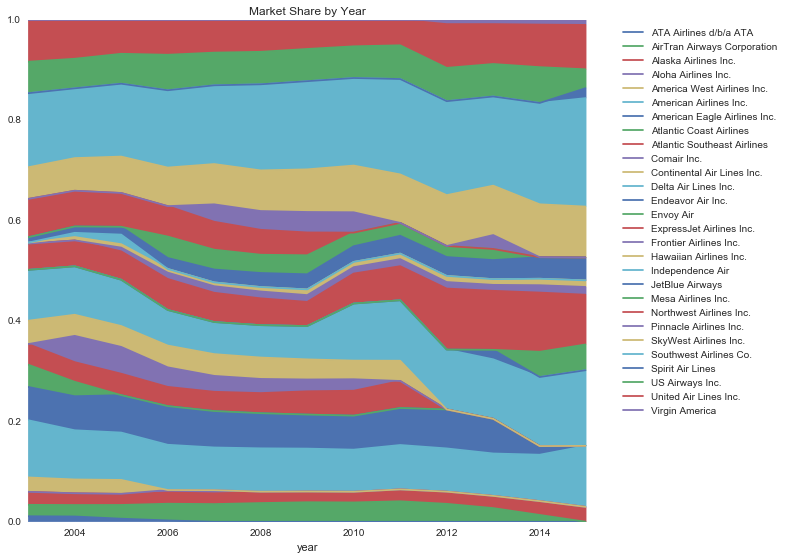

In [105]:
normalizedYearByAirline.plot(kind='area',figsize=(10,9),title='Market Share by Year',ylim=(0, 1))
plt.legend(bbox_to_anchor=(1.05,1),loc=2)
#yearByAirline.plot(kind='area')

In [28]:
cols=list(normalizedYearByAirline.columns.values)
reOrderedByMergers_df=normalizedYearByAirline[[
 'Southwest Airlines Co.',
'Delta Air Lines Inc.',
'American Airlines Inc.',
'US Airways Inc.',
'United Air Lines Inc.',
'ATA Airlines d/b/a ATA',
 'AirTran Airways Corporation' ,
  'Northwest Airlines Inc.',
 'America West Airlines Inc.',
 'Continental Air Lines Inc.',
 'SkyWest Airlines Inc.',
 'Atlantic Southeast Airlines',
 'JetBlue Airways',
 'Alaska Airlines Inc.',
 'Spirit Air Lines',
 'Frontier Airlines Inc.',
 'Atlantic Coast Airlines',
 'American Eagle Airlines Inc.',
 'ExpressJet Airlines Inc.',
 'Hawaiian Airlines Inc.',
 'Comair Inc.',
 'Independence Air',
 'Mesa Airlines Inc.',
 'Aloha Airlines Inc.',
 'Pinnacle Airlines Inc.',
 'Virgin America',
 'Endeavor Air Inc.',
 'Envoy Air']]
reOrderedByMergers_df.head()
currentMajorPlusMerges_df=normalizedYearByAirline.loc[:,[
         'Southwest Airlines Co.',
'Delta Air Lines Inc.',
'American Airlines Inc.',
'US Airways Inc.',
'United Air Lines Inc.',
'ATA Airlines d/b/a ATA',
 'AirTran Airways Corporation' ,
  'Northwest Airlines Inc.',
 'America West Airlines Inc.',
 'Continental Air Lines Inc.']]
currentMajorPlusMerges_df['Other']=1-currentMajorPlusMerges_df.sum(axis=1)
currentMajorPlusMerges_df.head()
#len(list(currentMajorPlusMerges_df.columns.values))
#rowNorm_df1=df1.div(df1.sum(axis=1),axis=0)




carrier_name,Southwest Airlines Co.,Delta Air Lines Inc.,American Airlines Inc.,US Airways Inc.,United Air Lines Inc.,ATA Airlines d/b/a ATA,AirTran Airways Corporation,Northwest Airlines Inc.,America West Airlines Inc.,Continental Air Lines Inc.,Other
year,,,,,,,,,,,
2003,0.147459,0.101242,0.113923,0.062699,0.083883,0.011064,0.022735,0.076325,0.028662,0.046499,0.305508
2004,0.138921,0.096453,0.097983,0.058901,0.077962,0.010595,0.022801,0.071155,0.027484,0.041986,0.355759
2005,0.145091,0.092191,0.094330,0.059604,0.068050,0.006177,0.027364,0.067338,0.027708,0.041546,0.370602
2006,0.153925,0.070861,0.090115,0.070687,0.070010,0.002745,0.033275,0.060611,NaN,0.043320,0.404450
2007,0.156781,0.063831,0.085019,0.065113,0.065724,NaN,0.035297,0.055600,NaN,0.043344,0.429290


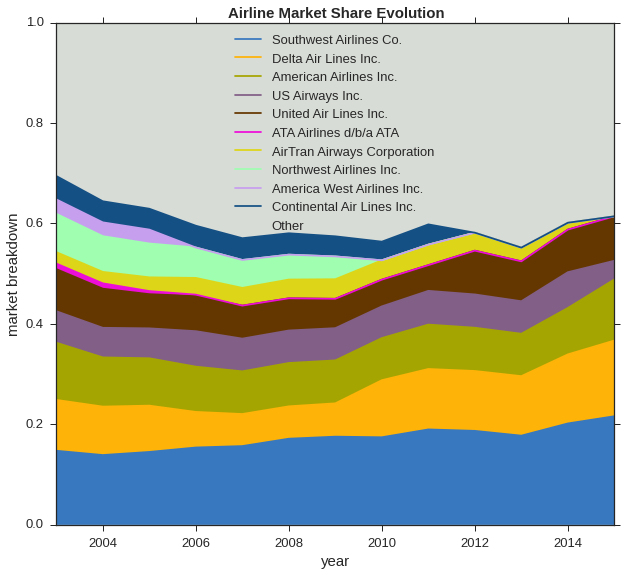

In [29]:
#reOrderedByMergers_df.plot(kind='area',figsize=(10,9),title='Market Share by Year',ylim=(0, 1))
numberColors=len(list(currentMajorPlusMerges_df.columns.values))
#sns.palplot(sns.color_palette("Set2", 10))
#sns.set_palette("husl",n_colors=numberColors)
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
#http://xkcd.com/color/rgb/
#https://stanford.edu/~mwaskom/software/seaborn/tutorial/color_palettes.html#palette-tutorial
colors = ["windows blue", "amber", "puke", 
          "dusty purple","brown","fuchsia","piss yellow","mint","lavender","light navy",
          "light grey"]
#sns.palplot(sns.xkcd_palette(colors))
sns.set_palette(sns.color_palette(sns.xkcd_palette(colors)))
sns.set_style("ticks")
currentMajorPlusMerges_df.plot(kind='area',figsize=(10,9),title='Market Share by Year',ylim=(0, 1))
plt.legend(bbox_to_anchor=(.3,1),loc=2,prop={'size':13})
#stylistic stuff
plt.title('Airline Market Share Evolution',fontweight='bold',fontsize=15)
plt.xlabel('year',fontsize=15)
plt.ylabel('market breakdown',fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.savefig("MarketShareEvolution_new.png",dpi=150)
plt.savefig("MarketShareEvolution_new.svg",dpi=150)


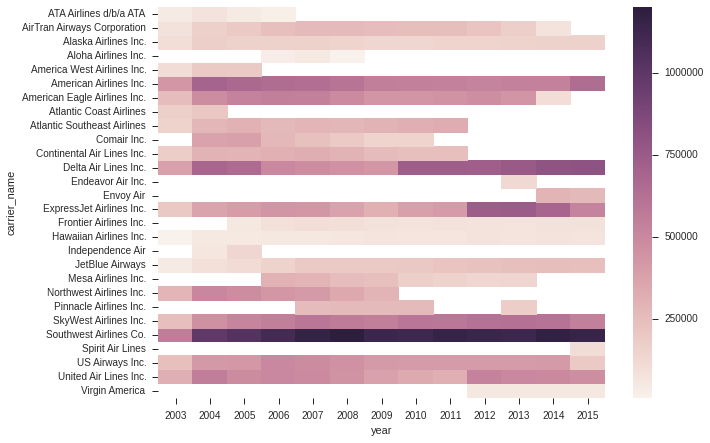

In [30]:
test=MarketShare.pivot("carrier_name","year","total flights")
plt.figure(figsize=(10,7))
sns.heatmap(test,fmt="d")

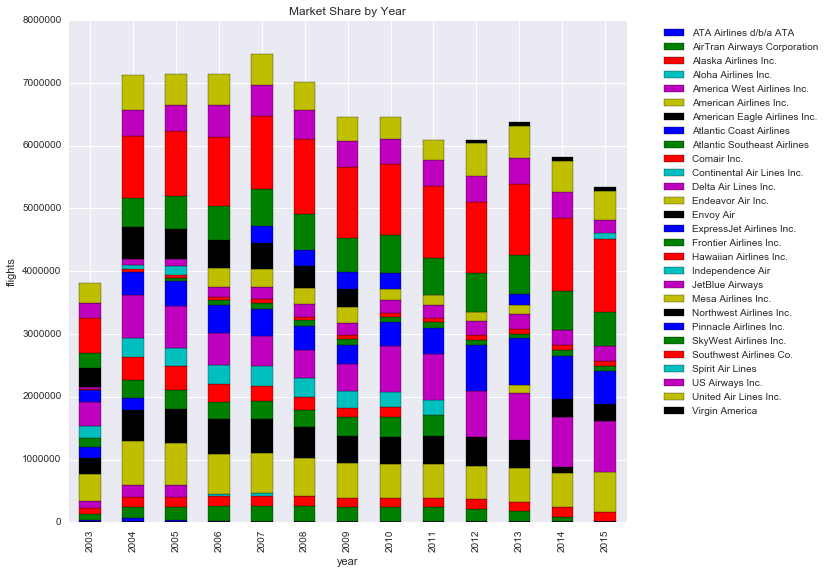

In [330]:
stackedPlot=yearByAirline.plot(kind='bar',stacked=True,figsize=(10,9),title='Market Share by Year')
stackedPlot.legend(bbox_to_anchor=(1.05,1),loc=2)
stackedPlot.set_ylabel('flights')

In [164]:
#fig2=stackedPlot.get_figure()
#fig2.savefig('MarketShareOverTime.png',bbox_extra_artists=(lgd,),bbox_inches='tight')
#fig2.savefig("MarketShareOverTime.png",dpi=(200),bbox_extra_artists=(stackedPlot.legend))